# Тестовое задание для команды HR платформы Сбер

Задание Classic ML:
Необходимо построить модель прогнозирования оттока клиентов по имеющимся признакам.
Признаки и таргет собраны для пары (пользователь, дата)
Структура данных:
churn  - таргет - ушел ли пользователь в отток
year    - год
month - месяц
26 признаков пользователя
Задача:

1) Разбить данные на выборки для обучения / валидации / тестирования модели

2) Построить модель оттока

3) Выбрать метрики для оценивания

4) Проанализировать результаты

5) Предложить улучшения модели

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, precision_score
from sklearn.metrics import roc_auc_score, confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.svm import OneClassSVM
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_predict
from sklearn.svm import SVC

import catboost
from catboost import *
from catboost import datasets
from catboost import CatBoostClassifier
import xgboost
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import shap

%matplotlib inline

In [2]:
df = pd.read_csv('churn_dataset.csv')

In [3]:
df.head()

,age,annualincome,calldroprate,callfailurerate,callingnum,customerid,customersuspended,education,gender,homeowner,...,totalminsusedinlastmonth,unpaidbalance,usesinternetservice,usesvoiceservice,percentagecalloutsidenetwork,totalcallduration,avgcallduration,churn,year,month
0,12,168147,0.06,0.00,4251078442,1,Yes,Bachelor or equivalent,Male,Yes,...,15,19,No,No,0.82,5971,663,0,2015,1
1,12,168147,0.06,0.00,4251078442,1,Yes,Bachelor or equivalent,Male,Yes,...,15,19,No,No,0.82,3981,995,0,2015,2
2,42,29047,0.05,0.01,4251043419,2,Yes,Bachelor or equivalent,Female,Yes,...,212,34,No,Yes,0.27,7379,737,0,2015,1
3,42,29047,0.05,0.01,4251043419,2,Yes,Bachelor or equivalent,Female,Yes,...,212,34,No,Yes,0.27,1729,432,0,2015,2
4,58,27076,0.07,0.02,4251055773,3,Yes,Master or equivalent,Female,Yes,...,216,144,No,No,0.48,3122,624,0,2015,1


In [4]:
df.noadditionallines.unique()

array(['\\N'], dtype=object)

Удаляем неинформативные поля:
    
    noadditionallines - содержит только одно значение - '\\N'
    callingnum - номер телефона абонента
    customerid - удалим позже (это поле понадобится для разбиения данных)

In [5]:
df.drop(['noadditionallines', 'callingnum'], inplace=True, axis=1)

В основном, абоненты встречаются в данных по 2 раза за наблюдаемый период, при этом всего 9 абонентов за это время перешли в категорию ушедших. Построить на таких данных модель оттока, учитывающую изменения фичей во времени не получится, поэтому для начала, можно просто игнорировать поля year и month.

array([[<AxesSubplot:title={'center':'churn'}>]], dtype=object)

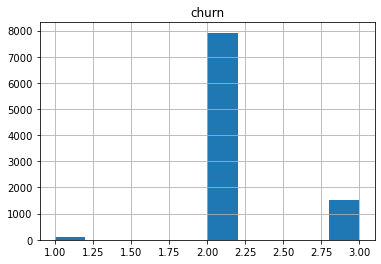

In [6]:
groups = df[['customerid', 'churn']].groupby('customerid').count()
groups.hist()

In [7]:
groups = df[['customerid', 'churn']].groupby('customerid').sum()

array([[<AxesSubplot:title={'center':'churn'}>]], dtype=object)

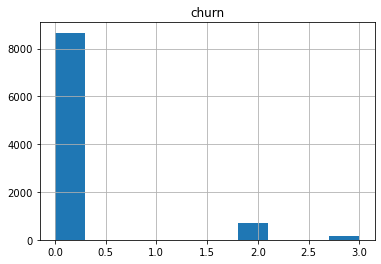

In [8]:
groups.hist()

In [9]:
groups[groups['churn'] == 1]

,churn
customerid,
645,1
2058,1
2261,1
3981,1
6890,1
6929,1
7897,1
8257,1
9070,1


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20468 entries, 0 to 20467
Data columns (total 27 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   age                                   20468 non-null  int64  
 1   annualincome                          20468 non-null  int64  
 2   calldroprate                          20468 non-null  float64
 3   callfailurerate                       20468 non-null  float64
 4   customerid                            20468 non-null  int64  
 5   customersuspended                     20468 non-null  object 
 6   education                             20468 non-null  object 
 7   gender                                20468 non-null  object 
 8   homeowner                             20468 non-null  object 
 9   maritalstatus                         20468 non-null  object 
 10  monthlybilledamount                   20468 non-null  int64  
 11  numberofcomplai

In [11]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,20468.0,45.334327,19.624577,12.0,28.00,45.00,62.00,79.00
annualincome,20468.0,124446.818253,72129.392001,4.0,61898.00,123689.50,187065.25,249987.00
calldroprate,20468.0,0.035021,0.022996,0.0,0.01,0.04,0.06,0.07
callfailurerate,20468.0,0.015239,0.011213,0.0,0.01,0.02,0.03,0.03
customerid,20468.0,4757.953342,2751.070062,1.0,2372.75,4754.00,7141.25,9525.00
monthlybilledamount,20468.0,59.630252,34.652681,0.0,29.00,60.00,90.00,119.00
numberofcomplaints,20468.0,1.499169,1.119153,0.0,0.00,2.00,3.00,3.00
numberofmonthunpaid,20468.0,3.489252,2.289740,0.0,1.00,3.00,5.00,7.00
numdayscontractequipmentplanexpiring,20468.0,49.366816,28.874138,0.0,24.00,49.00,74.00,99.00
penaltytoswitch,20468.0,248.792603,144.247247,0.0,124.00,249.00,373.00,499.00


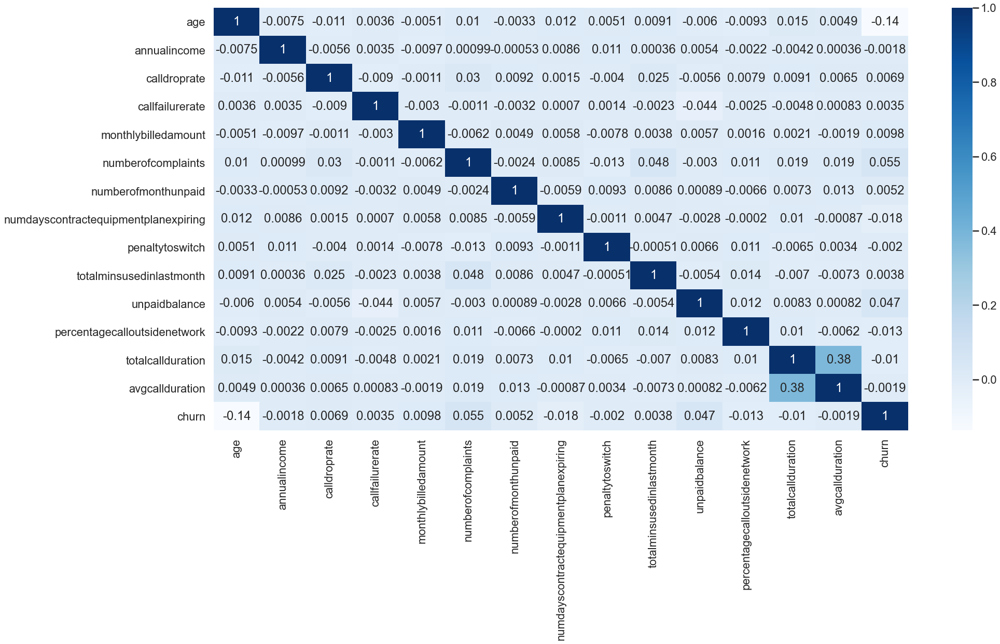

In [12]:
sns.set(rc={'figure.figsize':(30,15)})
sns.set_context("poster", font_scale=1)
    
sns.heatmap(df.drop(['customerid', 'year', 'month'], axis=1).iloc[:,:].corr(), cmap='Blues', annot=True);

In [13]:
df.churn.value_counts()

0    18605
1     1863
Name: churn, dtype: int64

In [14]:
# Выделим категориальные фичи
cat_features = list(df.select_dtypes(exclude=[np.int64, np.float64]).columns)

In [15]:
num_features = list(df.select_dtypes(include=[np.int64, np.float64]).columns)

Dataset has 0 variance; skipping density estimate.
Dataset has 0 variance; skipping density estimate.


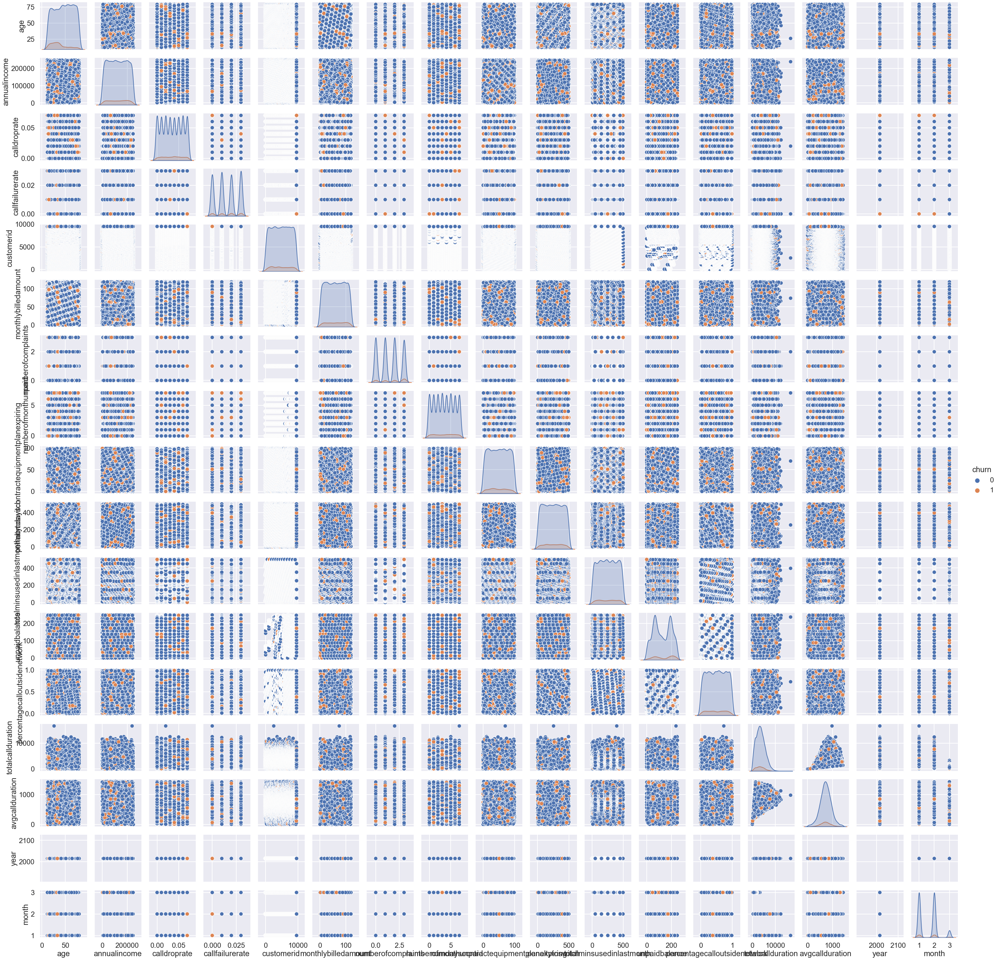

In [16]:
sns.pairplot(df[num_features], hue='churn')

In [17]:
cat_features

['customersuspended',
 'education',
 'gender',
 'homeowner',
 'maritalstatus',
 'occupation',
 'state',
 'usesinternetservice',
 'usesvoiceservice']

In [18]:
# Значения кат фичей в пределах 8, можно кодировать с помощью One-hot (для XGBoost)
for feature in cat_features:
    print(f'{feature}\n{df[feature].value_counts()}')

customersuspended
Yes    20026
No       442
Name: customersuspended, dtype: int64
education
High School or below      10217
Bachelor or equivalent     6138
Master or equivalent       3099
PhD or equivalent          1014
Name: education, dtype: int64
gender
Female    10474
Male       9994
Name: gender, dtype: int64
homeowner
Yes    16380
No      4088
Name: homeowner, dtype: int64
maritalstatus
Single     10446
Married    10022
Name: maritalstatus, dtype: int64
occupation
Others                        8189
Non-technology Related Job    6189
Technology Related Job        6090
Name: occupation, dtype: int64
state
HI    478
MD    469
NY    468
AK    461
FL    459
NH    455
WY    454
MN    451
AZ    450
KY    450
CA    449
PA    448
WA    444
CO    442
MT    442
WI    440
TX    437
OH    435
ND    427
SD    427
UT    425
IN    423
DE    423
IA    418
ID    411
VA    407
SC    404
LA    400
MA    398
MS    398
NV    397
KS    395
OR    394
NM    390
MI    388
IL    377
NJ    377
MO    377
RI 

In [19]:
def get_cmap(n, name='hsv'):
    return plt.cm.get_cmap(name, n)

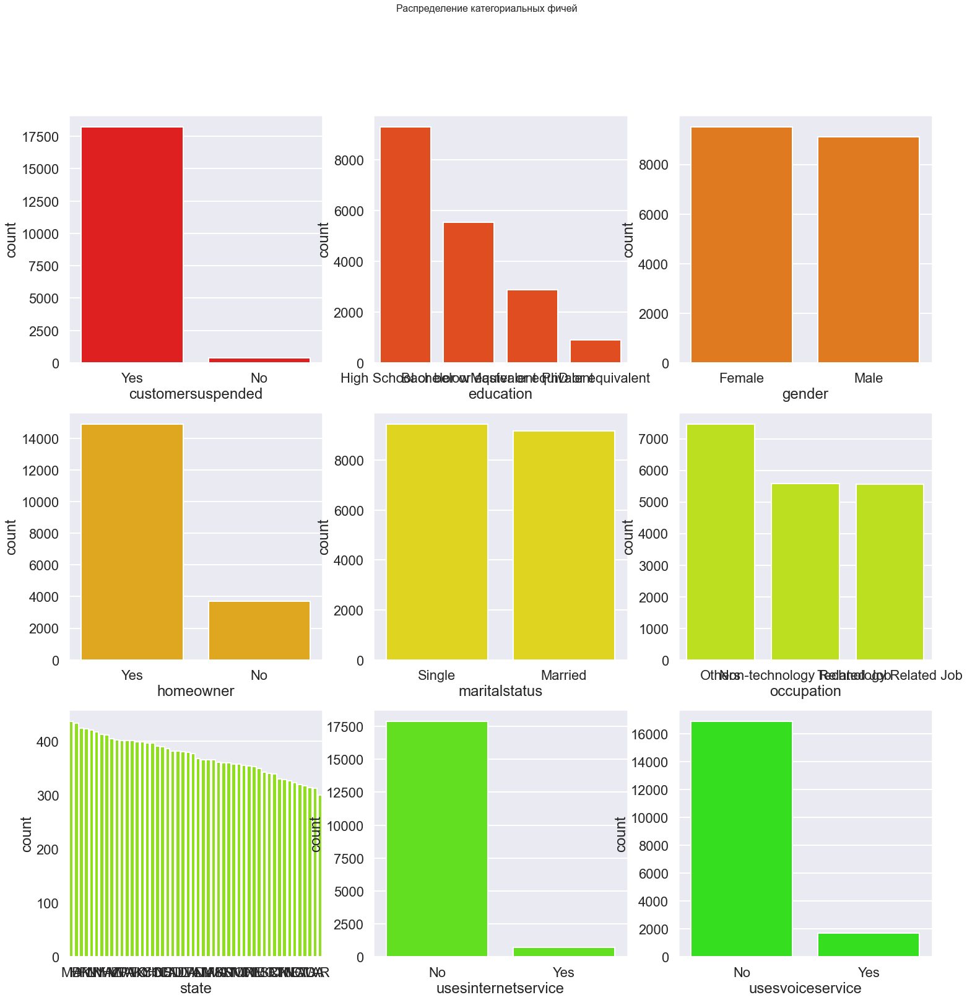

In [20]:
colors = get_cmap(26)
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(25, 25))
fig.suptitle("Распределение категориальных фичей", fontsize=(16))
for row_ind, axis_row in enumerate(axes):
      for ax_ind, axis in enumerate(axis_row):
        index = ax_ind + 3 * row_ind
        counts = df[df['churn'] == 0][cat_features[index]].value_counts()
        names = [name for name in counts.index]
        barplot = sns.barplot(x=names, y=counts.values, ax=axis, color=colors(index))
        barplot.set_xlabel(cat_features[index])
        barplot.set_ylabel('count')

##### ! Убрал это разделение, так как в данных нет дубликатов, наблюдения по одному и тому же человеку различаются. Имело бы смысл делить по времени (более ранние признаки отправлять в трейн), но в данных фактически таргет не меняется от времени, поэтому беру это как независимые события. 

Делим на трейн и тест.
Разные записи одного клиента должны попасть только в трейн или только в тест. Чтобы не получалось, что в трейне будет запись от 03.06 что человек ушел, а в тест попадет запись от 03.08 что он же ушел.

def group_customers_by_id(df):
    value_count = df.customerid.value_counts().reset_index()
    df_by_customer = df.set_index('customerid')
    return df_by_customer

def split_group(df_group, train_size=0.8):
    customers = df_group.index.unique()
    train_customers, test_customers = train_test_split(customers, train_size=train_size)
    train_df, test_df = df_group.loc[train_customers], df_group.loc[test_customers]
    return train_df, test_df

train_df, test_df = split_group(group_customers_by_id(df), train_size=0.7)

In [21]:
train_df, test_df = train_test_split(df.drop(['customerid'], axis=1), train_size=0.7)

In [22]:
train_df.shape, test_df.shape

((14327, 26), (6141, 26))

In [23]:
train_df.head()

,age,annualincome,calldroprate,callfailurerate,customersuspended,education,gender,homeowner,maritalstatus,monthlybilledamount,...,totalminsusedinlastmonth,unpaidbalance,usesinternetservice,usesvoiceservice,percentagecalloutsidenetwork,totalcallduration,avgcallduration,churn,year,month
6001,18,80953,0.00,0.02,Yes,High School or below,Female,Yes,Single,113,...,438,185,No,No,0.46,4248,1062,0,2015,2
15780,68,218537,0.02,0.01,Yes,Master or equivalent,Female,Yes,Single,37,...,80,155,No,No,0.14,3914,489,0,2015,1
12822,66,184964,0.05,0.03,Yes,Bachelor or equivalent,Male,Yes,Single,36,...,311,222,No,Yes,0.51,2123,707,0,2015,1
11735,57,55407,0.00,0.02,Yes,High School or below,Male,Yes,Single,37,...,138,47,No,No,0.47,6161,684,0,2015,2
6853,64,72180,0.02,0.01,Yes,Bachelor or equivalent,Female,Yes,Single,24,...,497,56,No,No,0.54,1695,847,0,2015,2


In [24]:
train_df.reset_index(drop=True, inplace=True)
test_df.reset_index(drop=True, inplace=True)

In [25]:
models_out = []

In [26]:
train_df = train_df.sample(train_df.shape[0])
X = train_df.drop(['churn', 'year', 'month'], axis=1)
y = train_df['churn']

test_df = test_df
X_test = test_df.drop(['churn', 'year', 'month'], axis=1)
y_test = test_df['churn']

In [27]:
bin_features = ['customersuspended',
 'gender',
 'homeowner',
 'maritalstatus',
 'usesinternetservice',
 'usesvoiceservice']

ohe_features = ['education', 'occupation', 'state']

for feature in bin_features:
    le = LabelEncoder()
    X[feature] = le.fit_transform(X[feature])
    X_test[feature] = le.transform(X_test[feature])

In [28]:
OH_encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
OH_cols_train = pd.DataFrame(OH_encoder.fit_transform(X[ohe_features]))
OH_cols_test = pd.DataFrame(OH_encoder.transform(X_test[ohe_features]))

OH_cols_train.index = X.index
OH_cols_test.index = X_test.index

num_X_train = X.drop(ohe_features, axis=1)
num_X_test = X_test.drop(ohe_features, axis=1)

OH_X_train = pd.concat([num_X_train, OH_cols_train], axis=1)
OH_X_test = pd.concat([num_X_test, OH_cols_test], axis=1)

In [29]:
OH_X_train.head()

,age,annualincome,calldroprate,callfailurerate,customersuspended,gender,homeowner,maritalstatus,monthlybilledamount,numberofcomplaints,...,47,48,49,50,51,52,53,54,55,56
11114,42,209512,0.07,0.02,1,0,1,1,25,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6586,32,135400,0.01,0.02,1,1,1,0,79,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7682,35,95676,0.00,0.02,1,0,1,1,114,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7317,55,195282,0.06,0.01,1,0,0,0,85,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6083,33,141298,0.07,0.02,1,0,1,1,86,2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [73]:
trees = 1000
colsample_bytree = 0.5
max_depth = 4
learning_rate = 0.03

xgboost_model = xgboost.XGBClassifier(n_estimators=trees, n_jobs=-1, max_depth=max_depth,
                                      learning_rate=learning_rate, booster='gbtree', eval_metric='logloss',
                                      colsample_bytree=colsample_bytree, seed=55)
xgboost_model.fit(OH_X_train, y, verbose=True)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.5,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.03, max_bin=256,
              max_cat_to_onehot=4, max_delta_step=0, max_depth=4, max_leaves=0,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=-1, num_parallel_tree=1,
              predictor='auto', random_state=55, reg_alpha=0, reg_lambda=1, ...)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


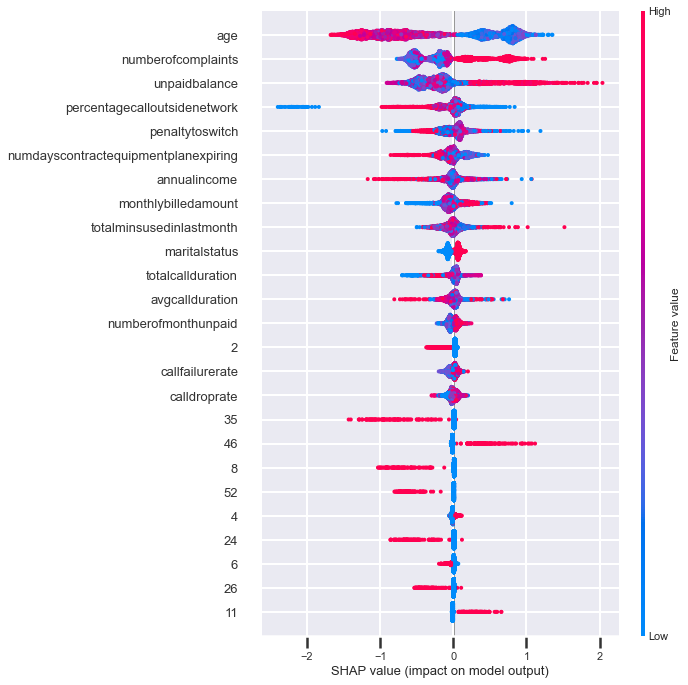

In [31]:
shap_test = shap.TreeExplainer(xgboost_model).shap_values(OH_X_test)
shap.summary_plot(shap_test, OH_X_test,
                      max_display=25)

In [74]:
y_pred = xgboost_model.predict_proba(OH_X_test)

In [75]:
roc_auc = roc_auc_score(y_test, [y[1] for y in y_pred])

In [77]:
models_out.append((f'XGBoost_trees_1000_colsample_by_tree_0.5_max_depth_4_lr_0.03', roc_auc))

In [34]:
y_pred = xgboost_model.predict(OH_X_test)

In [36]:
roc_auc_score(y_test, y_pred)

0.5152284263959391

In [37]:
xgboost_model = xgboost.XGBClassifier(seed=55)

In [42]:
# для ускорения выполнения
# params = { 'max_depth': [3,6,10],
#            'learning_rate': [0.01, 0.05, 0.1],
#            'n_estimators': [500, 1000, 2000],
#            'colsample_bytree': [0.1, 0.5, 0.3, 0.7]}

params = {'colsample_bytree': [0.5],
          'learning_rate': [0.05],
          'max_depth': [10],
          'n_estimators': [1000],
          'seed': [55]}

In [43]:
clf = GridSearchCV(estimator=xgboost_model, param_grid=params, scoring='roc_auc', verbose=1, n_jobs=-1)

clf.fit(OH_X_train, y)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:   29.0s finished


GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_bin=None,
                                     max_cat_to_...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                

In [44]:
clf.best_params_

{'colsample_bytree': 0.5,
 'learning_rate': 0.05,
 'max_depth': 10,
 'n_estimators': 1000,
 'seed': 55}

In [46]:
y_pred = clf.predict_proba(OH_X_test)

In [47]:
roc_auc = roc_auc_score(y_test, [y[1] for y in y_pred])

In [49]:
models_out.append((f'XGBoost_trees_1000_colsample_by_tree_0.5_max_depth_10_lr_0.05', roc_auc))

In [50]:
y_pred = clf.predict(OH_X_test)

In [51]:
roc_auc_score(y_test, y_pred)

0.8441514611057759

## CatBoost

Возьмем катбуст, так как он из коробки умеет работать с категориальными фичами и обычно показывает неплохое качество.

In [52]:
model = CatBoostClassifier(iterations=500, auto_class_weights='Balanced', cat_features=cat_features, silent=True)

In [53]:
model.fit(X=X, y=y, cat_features=cat_features, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [54]:
y_pred = model.predict(X_test)

In [55]:
roc_auc_score(y_test, y_pred)

0.8363707870306856

In [56]:
params = {"iterations": [100],
          "depth": [4, 6, 8],
          "l2_leaf_reg": [1, 3],
          "one_hot_max_size": [2, 5, 10, 50],
          "bagging_temperature": [0, 1]}

In [57]:
model = CatBoostClassifier(iterations=500, auto_class_weights='Balanced', cat_features=cat_features, silent=True)

In [58]:
model.grid_search(params, X=X, y=y, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 0.5580823171
bestIteration = 99

0:	loss: 0.5580823	best: 0.5580823 (0)	total: 4.21s	remaining: 3m 17s

bestTest = 0.5540877722
bestIteration = 99

1:	loss: 0.5540878	best: 0.5540878 (1)	total: 8.47s	remaining: 3m 14s

bestTest = 0.5540877722
bestIteration = 99

2:	loss: 0.5540878	best: 0.5540878 (1)	total: 12.8s	remaining: 3m 11s

bestTest = 0.5541235626
bestIteration = 99

3:	loss: 0.5541236	best: 0.5540878 (1)	total: 13.2s	remaining: 2m 25s

bestTest = 0.5582840128
bestIteration = 97

4:	loss: 0.5582840	best: 0.5540878 (1)	total: 17.7s	remaining: 2m 32s

bestTest = 0.5542592063
bestIteration = 97

5:	loss: 0.5542592	best: 0.5540878 (1)	total: 21.5s	remaining: 2m 30s

bestTest = 0.5542592063
bestIteration = 97

6:	loss: 0.5542592	best: 0.5540878 (1)	total: 25.6s	remaining: 2m 29s

bestTest = 0.5523973894
bestIteration = 99

7:	loss: 0.5523974	best: 0.5523974 (7)	total: 26s	remaining: 2m 10s

bestTest = 0.5434632308
bestIteration = 99

8:	loss: 0.5434632	best: 0.5434632 (8

{'params': {'bagging_temperature': 0,
  'depth': 8,
  'one_hot_max_size': 50,
  'l2_leaf_reg': 1,
  'iterations': 100},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
       

In [59]:
model.get_feature_importance(prettified=True)

,Feature Id,Importances
0,age,27.686899
1,numberofcomplaints,17.993872
2,unpaidbalance,16.726757
3,numdayscontractequipmentplanexpiring,3.741851
4,annualincome,3.471461
5,monthlybilledamount,3.238399
6,totalminsusedinlastmonth,3.164713
7,education,3.090443
8,numberofmonthunpaid,2.791660
9,callfailurerate,2.699387


In [60]:
y_pred = model.predict_proba(X_test)

In [61]:
roc_auc = roc_auc_score(y_test, [y[1] for y in y_pred])

In [62]:
models_out.append((f'CatBoost_default_iter_500', roc_auc))

In [63]:
y_pred = model.predict(X_test)

In [64]:
roc_auc_score(y_test, y_pred), f1_score(y_test, y_pred), precision_score(y_test, y_pred)

(0.7838775323546897, 0.3801904761904762, 0.24532940019665683)

In [65]:
cf_matrix = confusion_matrix(y_test, y_pred, normalize='true')

[Text(0, 0.5, 'False'), Text(0, 1.5, 'True')]

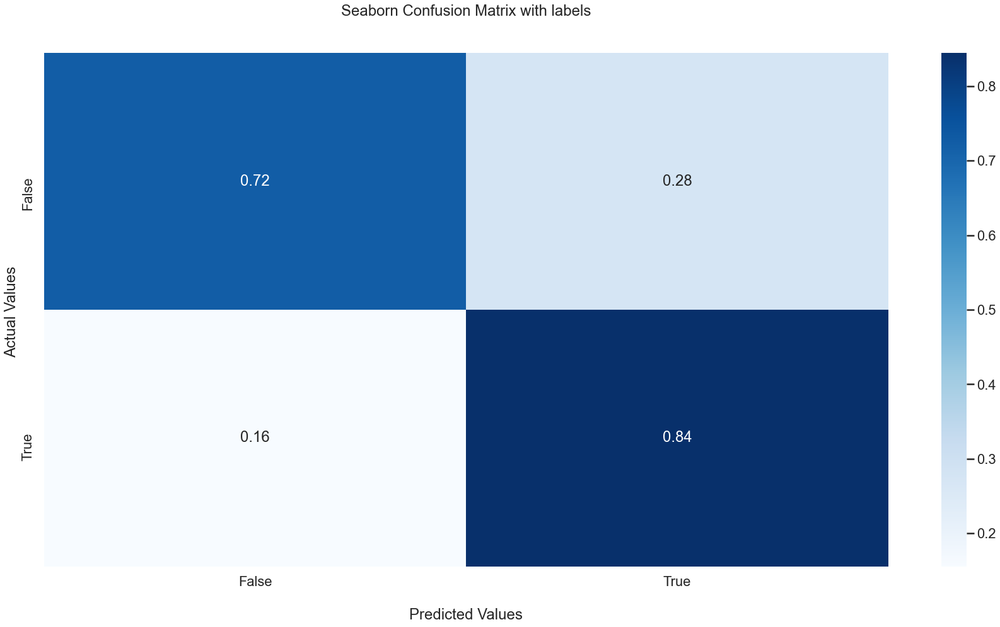

In [66]:
ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

ax.set_title('Seaborn Confusion Matrix with labels\n\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

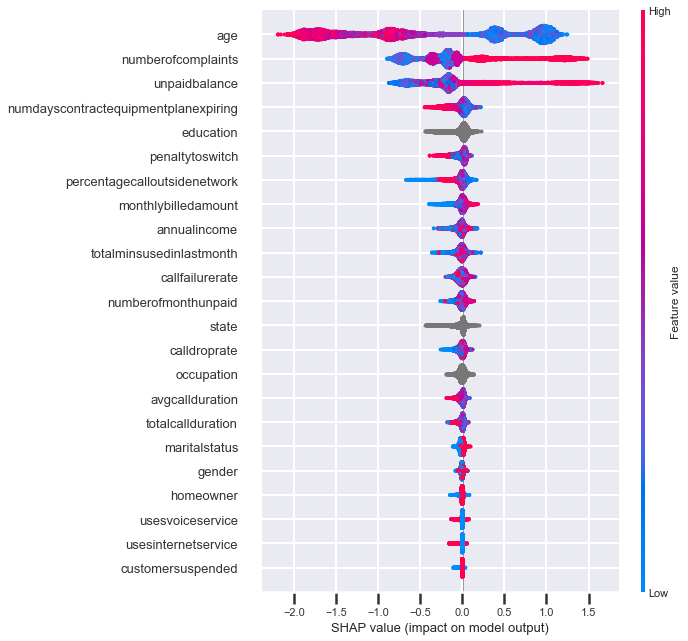

In [67]:
shap_test = shap.TreeExplainer(model).shap_values(X)
shap.summary_plot(shap_test, X,
                      max_display=25)

In [78]:
models_out_dict = {x[0]: x[1:] for x in models_out}

df_models = pd.DataFrame(models_out_dict.values(), columns=['roc-auc'], index=models_out_dict.keys())

In [79]:
df_models

,roc-auc
XGBoost_trees_1000_colsample_by_tree_0.5_max_depth_4_lr_0.03,0.870562
XGBoost_trees_1000_colsample_by_tree_0.5_max_depth_10_lr_0.05,0.935761
CatBoost_default_iter_500,0.892746


<AxesSubplot:>

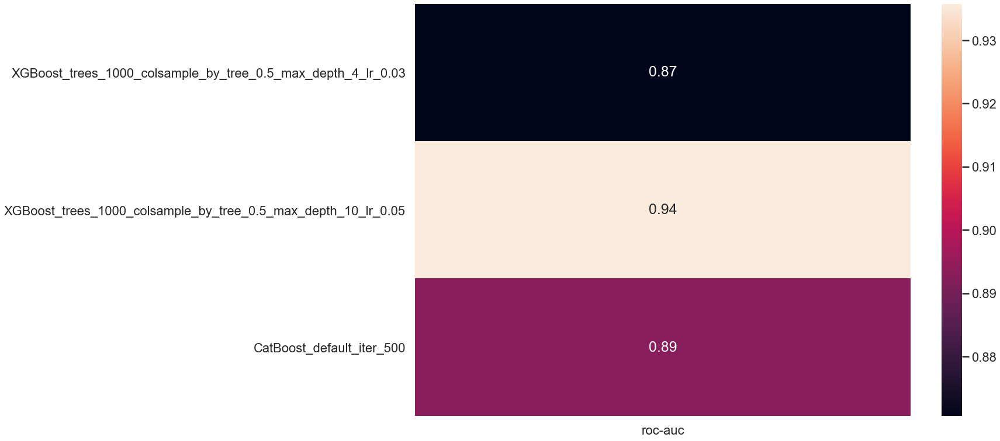

In [80]:
plt.figure(figsize=(19,13))
sns.heatmap(df_models, annot=True, annot_kws={"fontsize":25})

In [ ]:
Для задачи моделирования оттока клиентов можно отранжировать клиентов по вероятности ухода, чтобы можно было 
каким-то образом на них повлиять. Поэтому тут подходит метрика roc-auc на предсказанных вероятностях ухода.

В реальной задаче нужно делить трейн и тест так, чтобы модель не заглядывала "в будующее". Если бы у нас были наблюдения по 
каждому клиенту во времени, можно было бы решать эту задачу с помощью реккурентной нейронной сети или построить прогностическую
модель оттока на экстраполяции значений фичей (там, где есть 2 и более наблюдений).

Для улучшения текущего классификатора, нужно провести более детальный анализ фичей, например заменить state н